<a href="https://colab.research.google.com/github/2001-ES/Real-Time-Guava-Leaf-Detection-Using-YOLO/blob/main/yolov11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Fri Feb 28 08:42:13 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   62C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="H9i8YhxxQuC0OkKj3zfR")
project = rf.workspace("esha-wzuiy").project("febuary")
version = project.version(1)
dataset = version.download("yolov11")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 19.9 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Febuary-1 in yolov11:: 100%|██████████| 112/112 [00:00<00:00, 5016.63it/s]


In [ ]:
!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 35.7/112.6 GB disk)


In [ ]:
# Define the dataset location
dataset_location = '/content/Febuary-1'  # Replace with your actual dataset path

# Check if the data.yaml file exists
import os

if os.path.isfile(f'{dataset_location}/data.yaml'):
    print("data.yaml found")
else:
    raise FileNotFoundError(f"'{dataset_location}/data.yaml' does not exist")

# Change to the home directory
%cd /content

# Run the YOLOv8 training command
!yolo task=detect mode=train model=yolov8n.pt data={dataset_location}/data.yaml epochs=150 imgsz=800

data.yaml found
/content
100% 6.23M/6.23M [00:00<00:00, 70.4MB/s]
/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py:567: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental fea

In [ ]:
from IPython.display import Image

In [ ]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 MB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.1/322.1 kB 23.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 79.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 5.8 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2


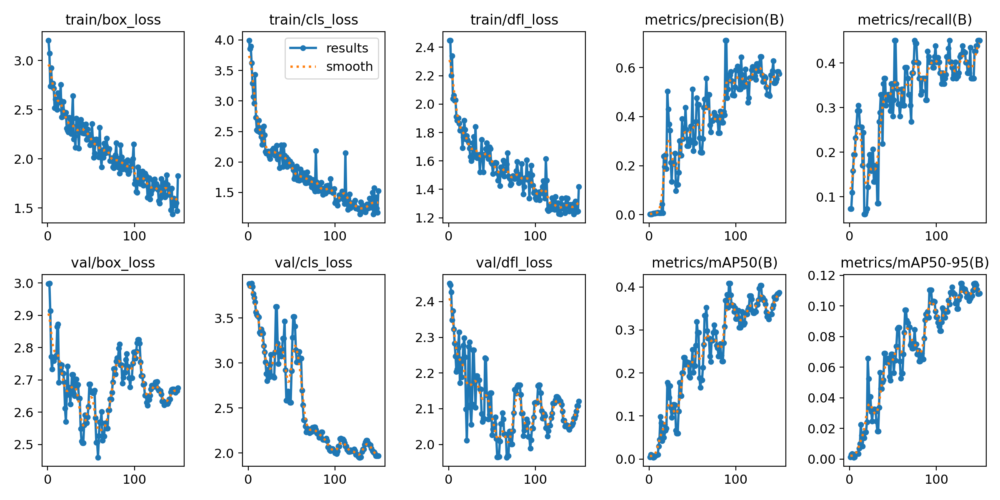

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/results.png", width=1000)

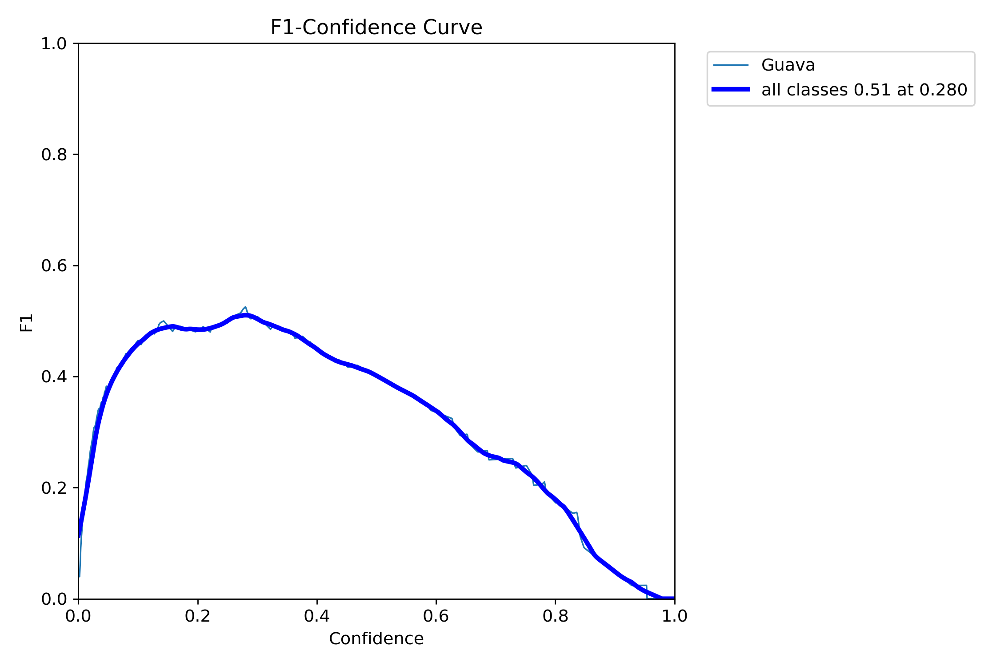

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/F1_curve.png", width=1000)

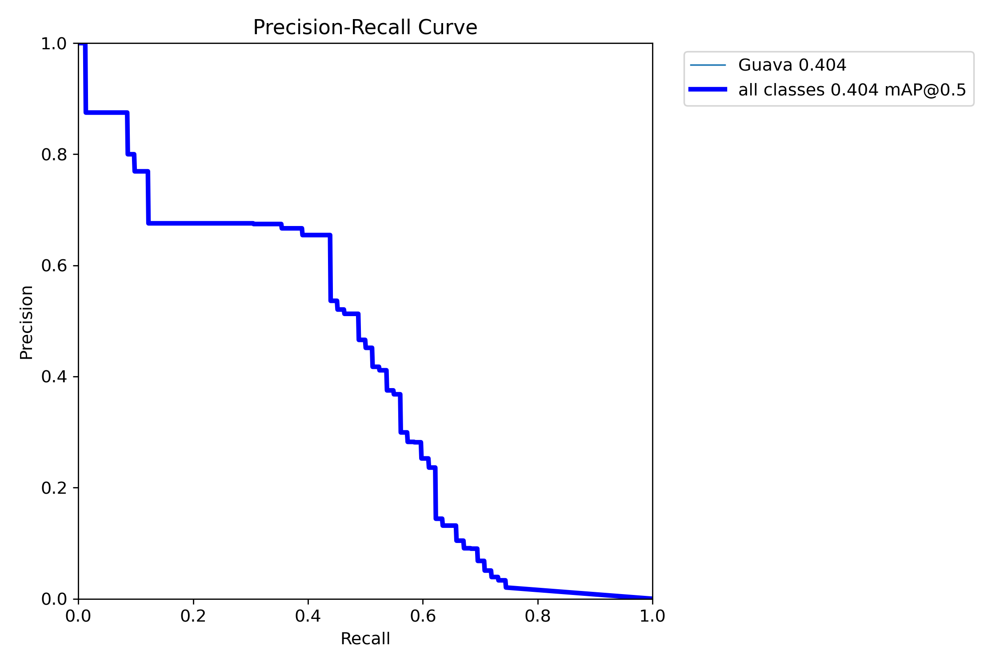

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/PR_curve.png", width=1000)

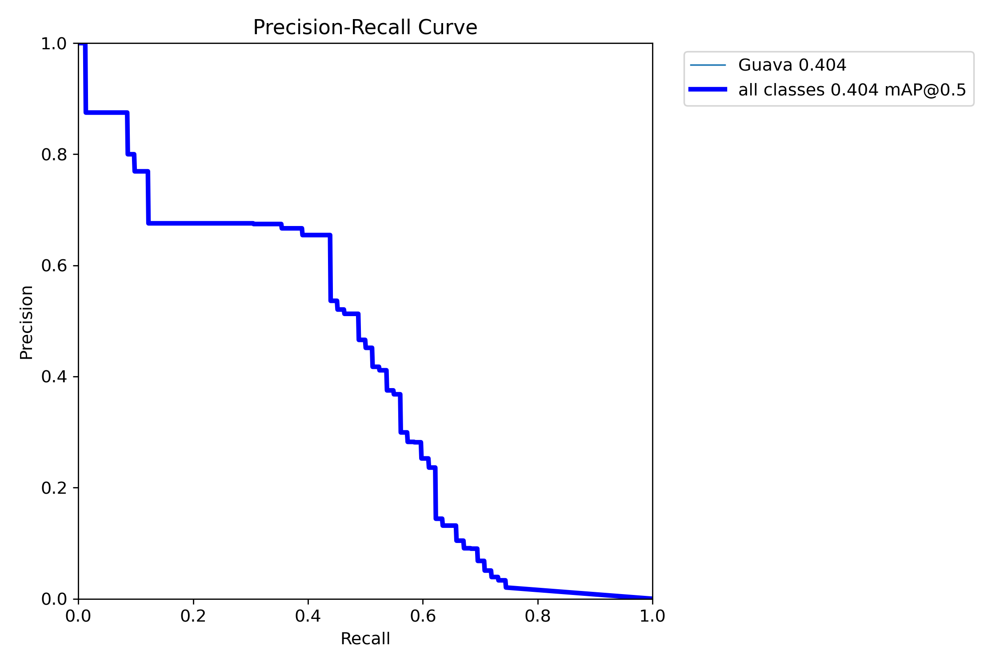

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/PR_curve.png", width=1000)

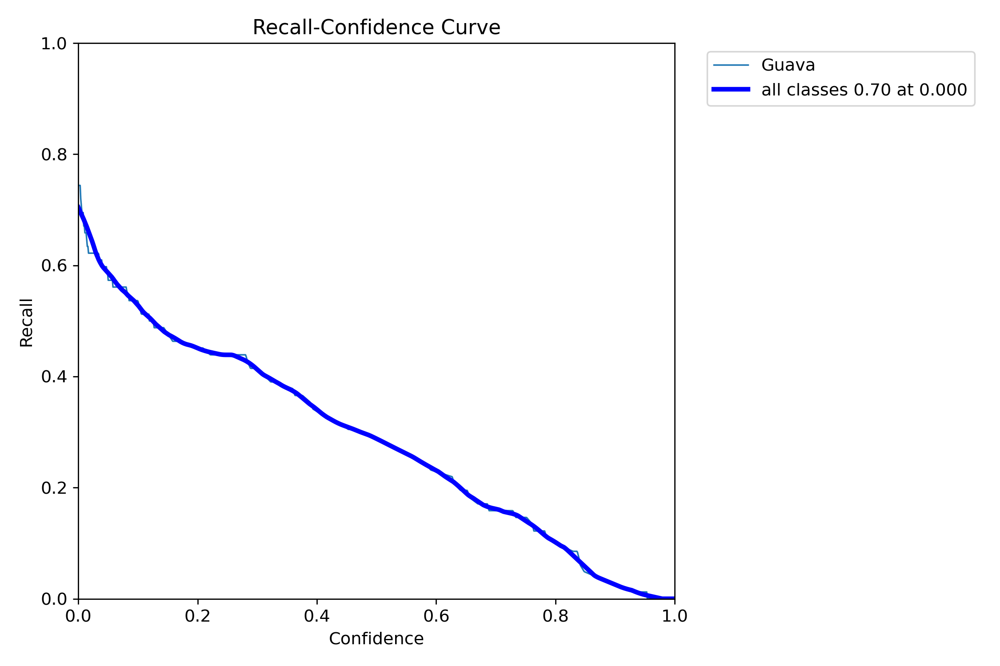

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/R_curve.png", width=1000)

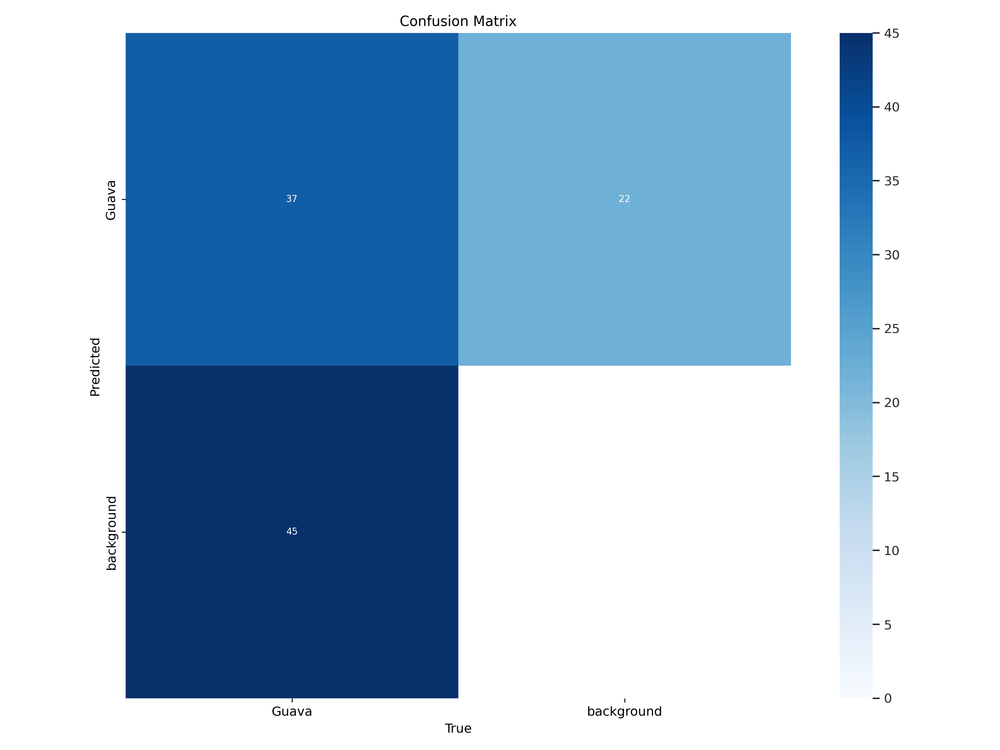

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/confusion_matrix.png", width=1000)

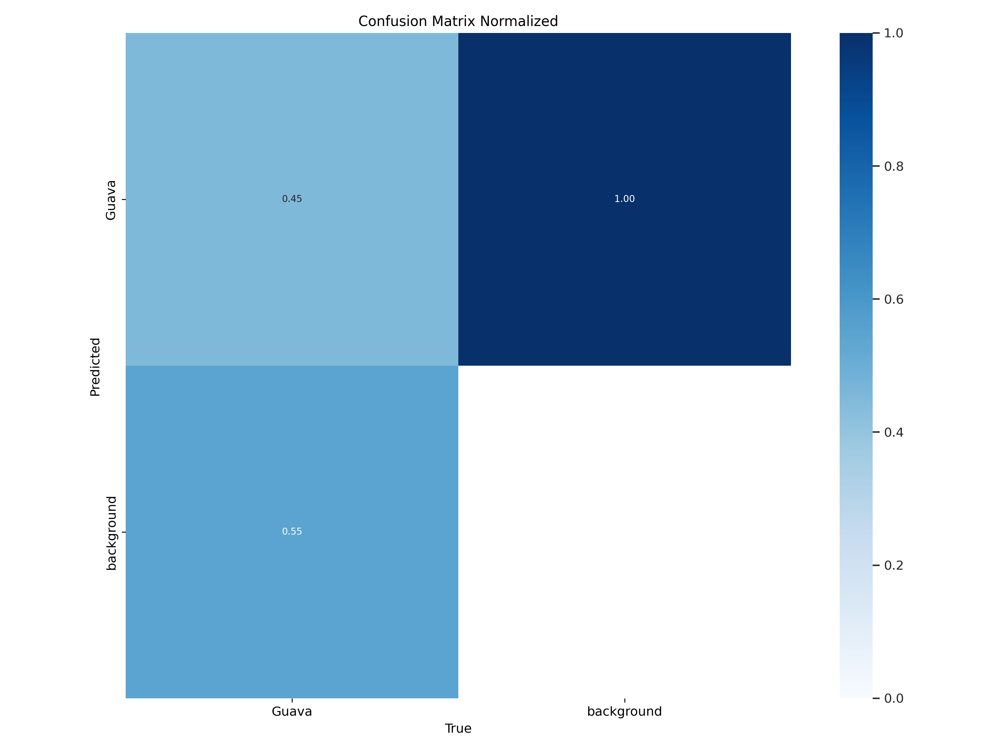

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/confusion_matrix_normalized.png", width=1000)

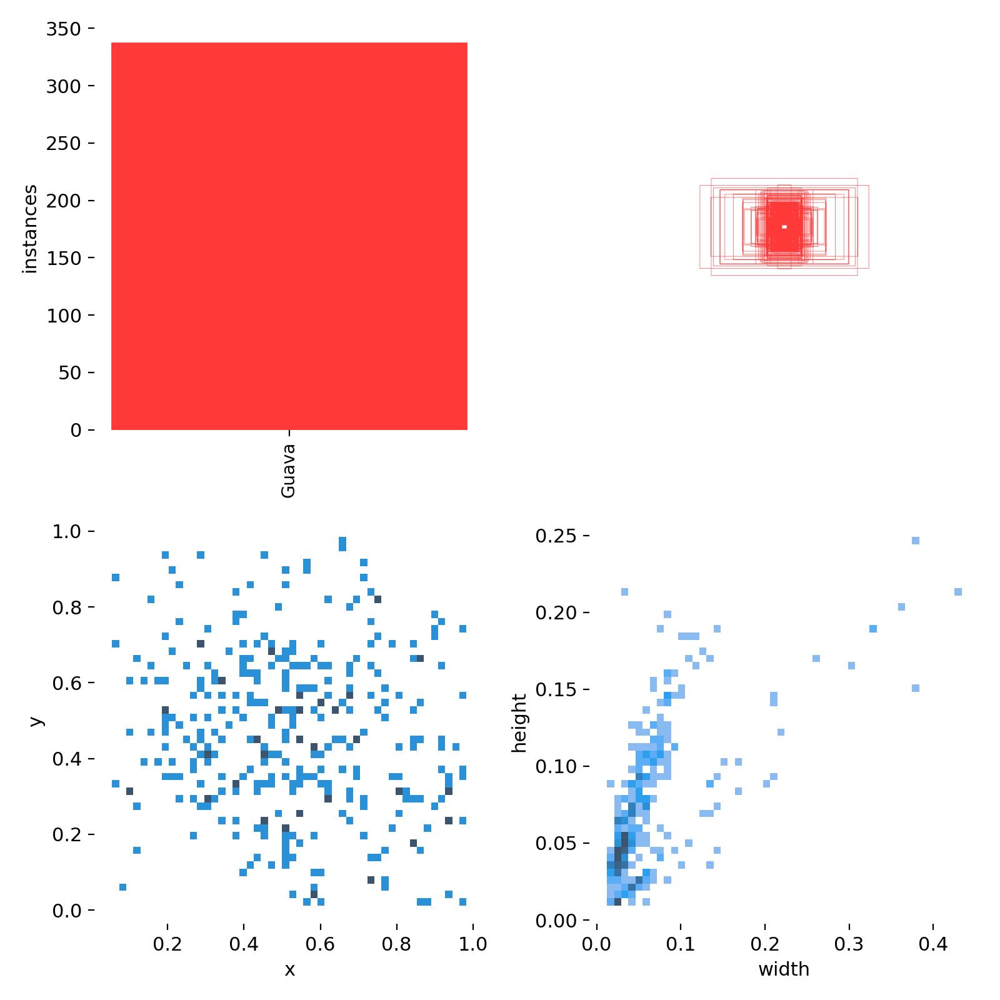

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/labels.jpg", width=1000)

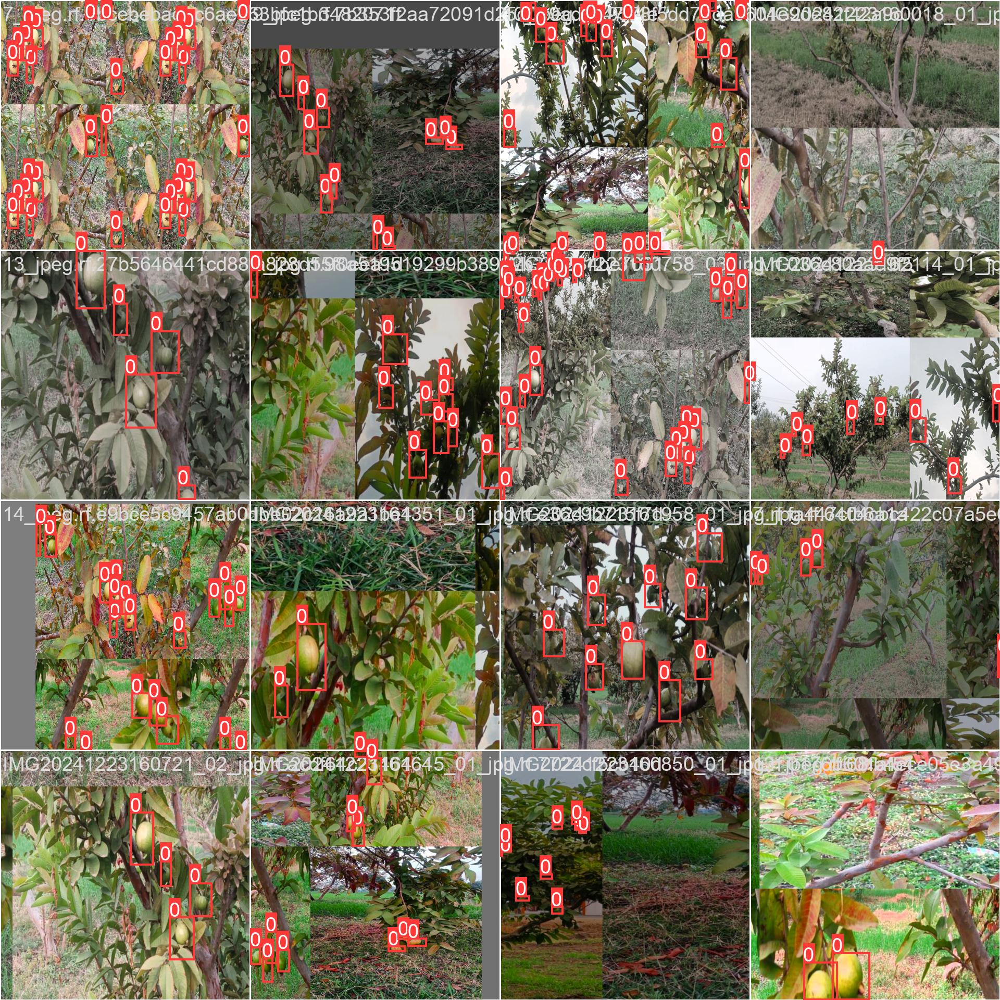

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/train_batch0.jpg", width=1000)

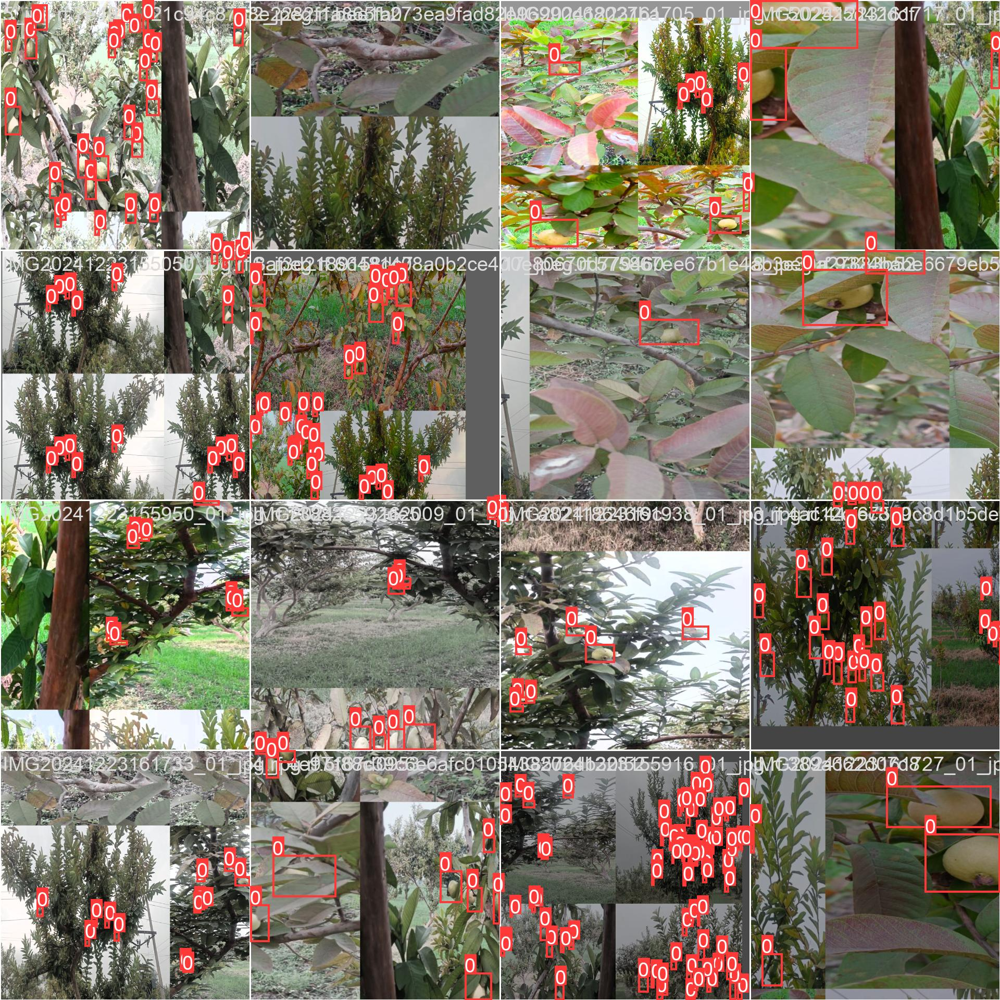

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/train_batch1.jpg", width=1000)

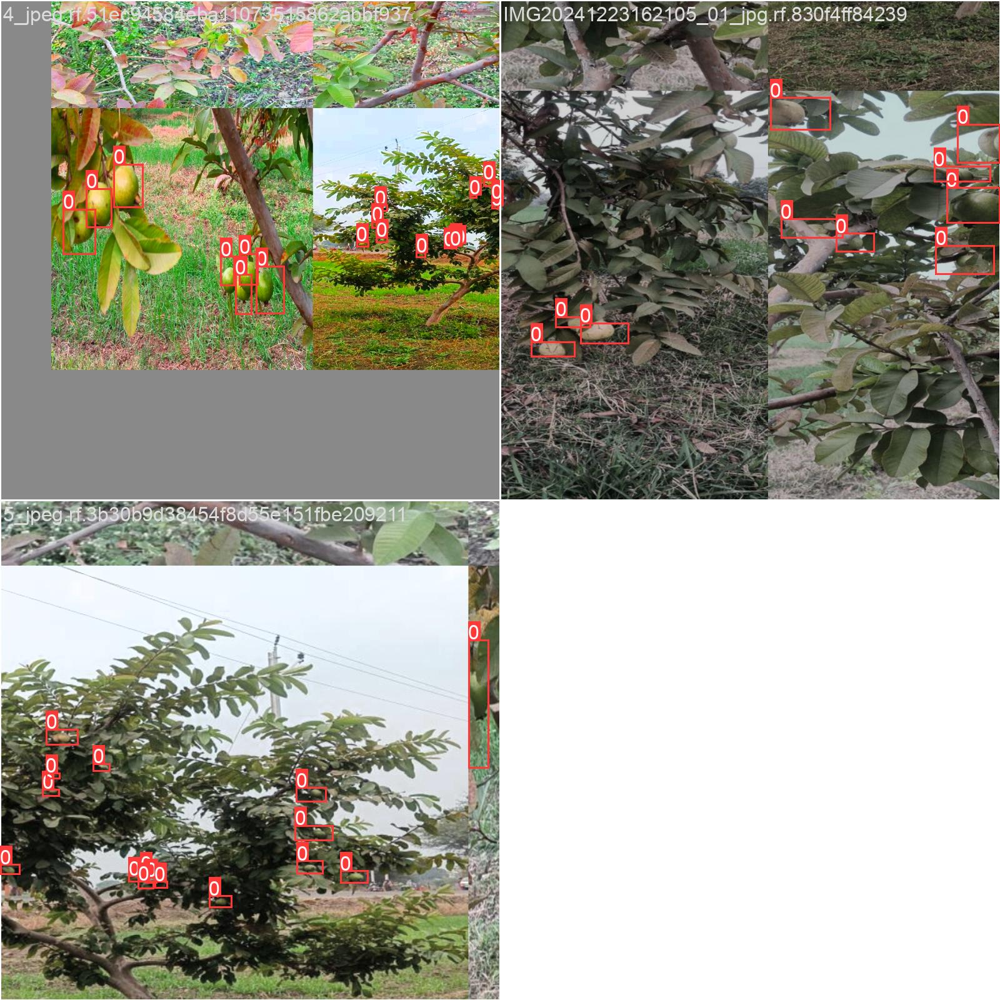

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/train_batch2.jpg", width=1000)

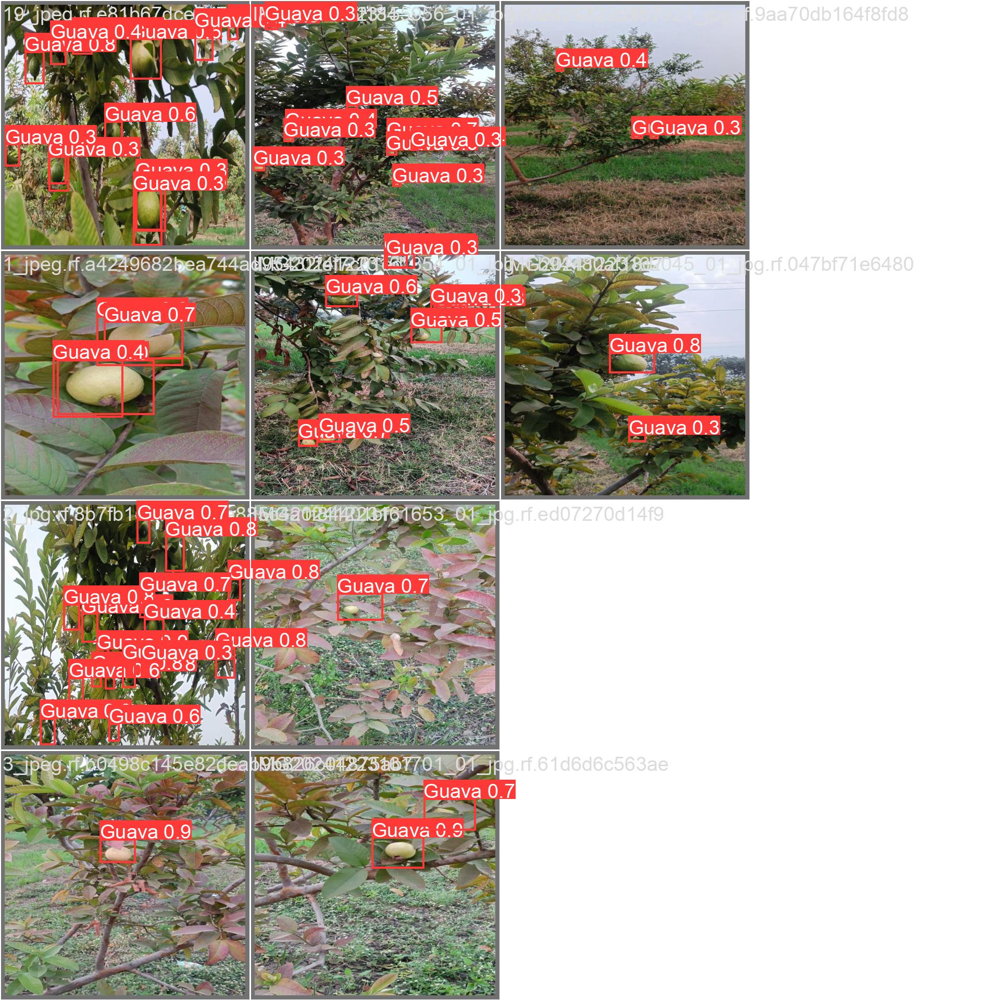

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/val_batch0_pred.jpg", width=5000)

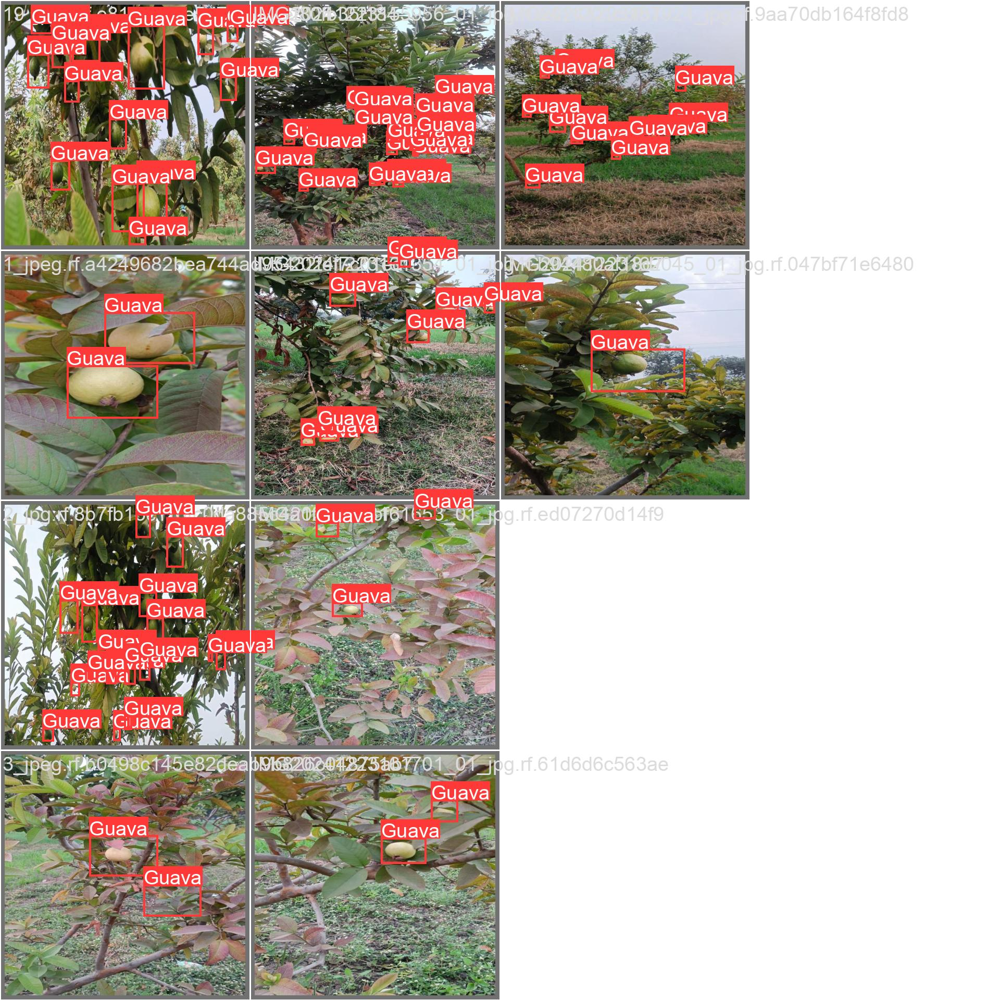

In [ ]:
Image(filename=f"{HOME}/runs/detect/train/val_batch0_labels.jpg")

In [ ]:
!sudo apt install tesseract-ocr
!sudo apt install libtesseract-dev

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 29 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (2,688 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
!pip install pytesseract

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.

image 1/1 /content/14.jpeg: 480x800 6 Guavas, 45.2ms
Speed: 4.7ms preprocess, 45.2ms inference, 141.3ms postprocess per image at shape (1, 3, 4

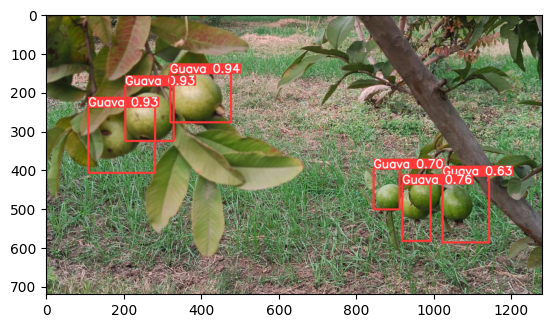

Total number of guavas detected: 3


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/14.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/1.jpeg: 800x480 2 Guavas, 52.9ms
Speed: 5.5ms preprocess, 52.9ms inference, 2.4ms postprocess per image at shape (1, 3, 800, 480)


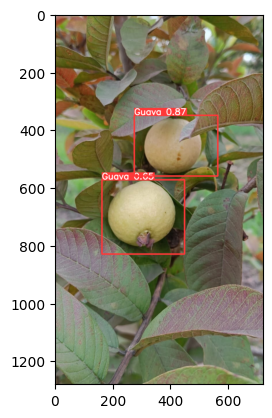

Total number of guavas detected: 2


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/1.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/10.jpeg: 480x800 1 Guava, 8.1ms
Speed: 3.0ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 800)


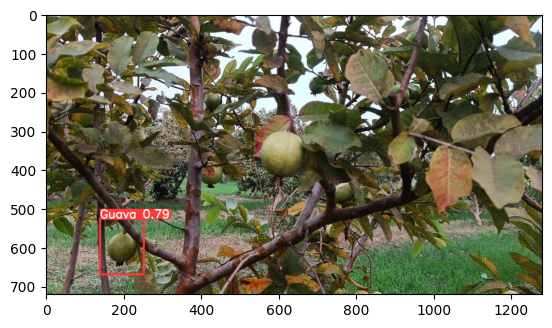

Total number of guavas detected: 1


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/10.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/12.jpeg: 480x800 7 Guavas, 16.4ms
Speed: 4.9ms preprocess, 16.4ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 800)


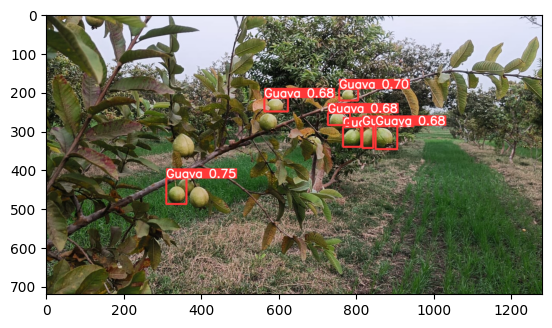

Total number of guavas detected: 7


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/12.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/13.jpeg: 480x800 4 Guavas, 9.1ms
Speed: 2.9ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 800)


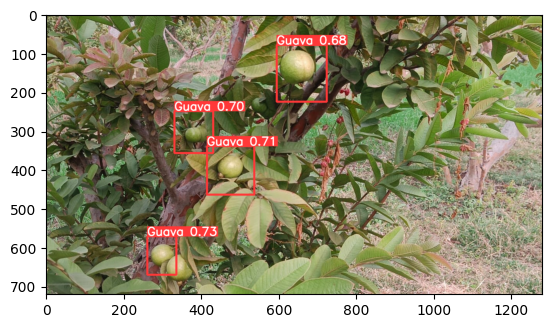

Total number of guavas detected: 4


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/13.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/IMG20241223161938_01.jpg: 480x800 (no detections), 10.1ms
Speed: 5.5ms preprocess, 10.1ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 800)


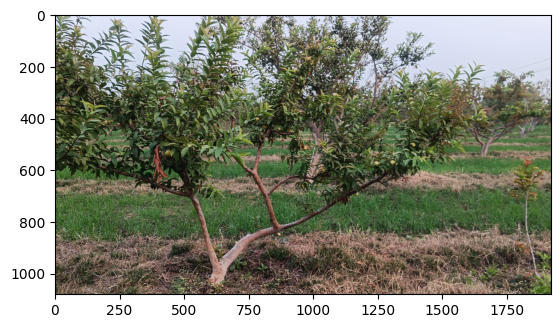

Total number of guavas detected: 0


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/IMG20241223161938_01.jpg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")

# ***Final 11 images**********************************


image 1/1 /content/1.jpeg: 800x480 2 Guavas, 9.8ms
Speed: 3.5ms preprocess, 9.8ms inference, 2.0ms postprocess per image at shape (1, 3, 800, 480)


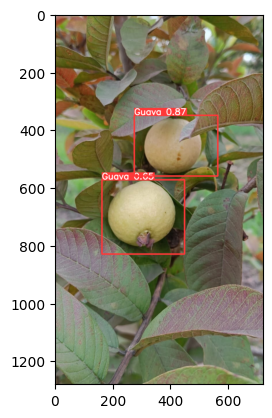

Total number of guavas detected: 2


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/1.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/10.jpeg: 480x800 1 Guava, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 800)


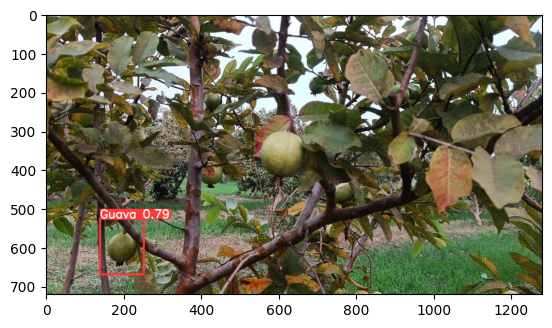

Total number of guavas detected: 1


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/10.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/11.jpeg: 480x800 1 Guava, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 800)


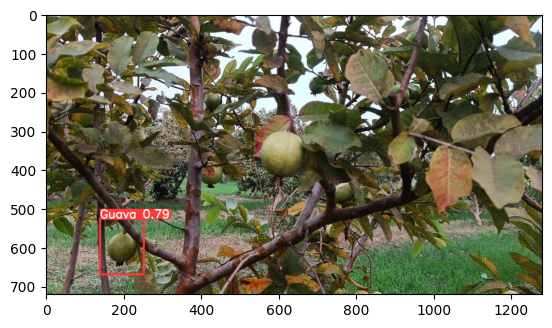

Total number of guavas detected: 1


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/11.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/12.jpeg: 480x800 7 Guavas, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 800)


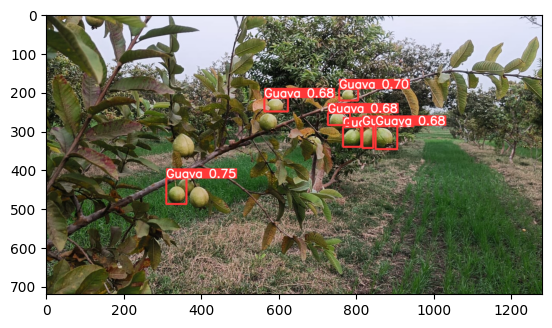

Total number of guavas detected: 7


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/12.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/13.jpeg: 480x800 4 Guavas, 8.1ms
Speed: 2.9ms preprocess, 8.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 800)


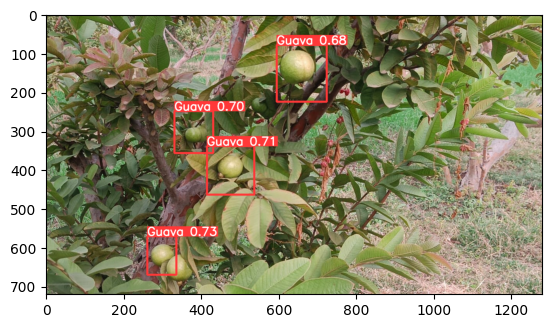

Total number of guavas detected: 4


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/13.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/14.jpeg: 480x800 6 Guavas, 8.4ms
Speed: 2.7ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 800)


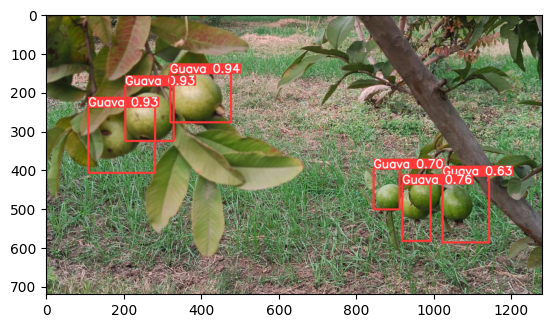

Total number of guavas detected: 3


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/14.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.

image 1/1 /content/2.jpeg: 800x480 2 Guavas, 8.0ms
Speed: 2.9ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 800, 4

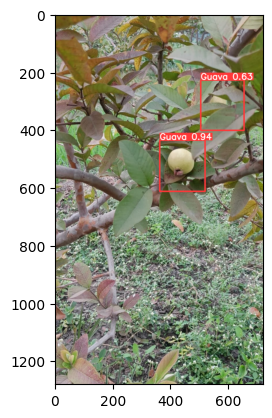

Total number of guavas detected: 2


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/2.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

#print(f"Total number of guavas detected: {guava_count}")
print(f"Total number of guavas detected: 2")



image 1/1 /content/3.jpeg: 800x480 (no detections), 8.9ms
Speed: 3.0ms preprocess, 8.9ms inference, 0.9ms postprocess per image at shape (1, 3, 800, 480)


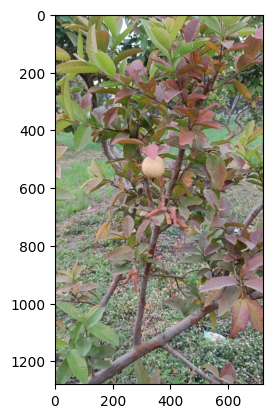

Total number of guavas detected: 0


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/3.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/3.jpg: 480x800 6 Guavas, 10.9ms
Speed: 5.1ms preprocess, 10.9ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 800)


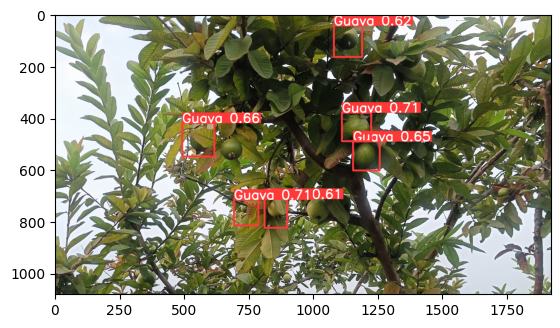

Total number of guavas detected: 6


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/3.jpg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/6.jpeg: 480x800 4 Guavas, 11.9ms
Speed: 4.5ms preprocess, 11.9ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 800)


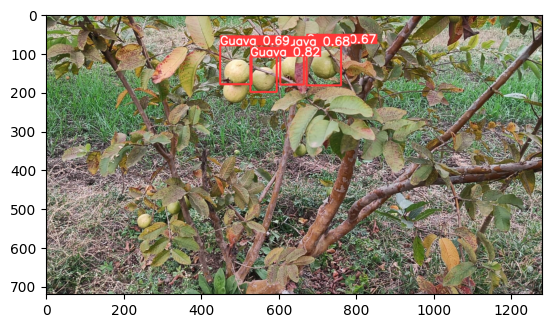

Total number of guavas detected: 4


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/6.jpeg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")


image 1/1 /content/IMG20241223161938_01.jpg: 480x800 (no detections), 8.0ms
Speed: 3.0ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 800)


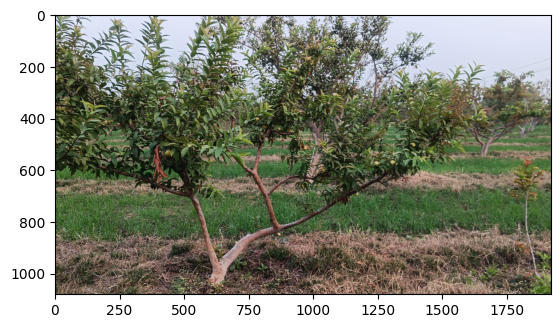

Total number of guavas detected: 0


In [ ]:
!pip install ultralytics==8.0.196 # Re-install the ultralytics module

from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load a pretrained YOLOv8n model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Run inference on an image
results = model('/content/IMG20241223161938_01.jpg', conf=0.6)

# Iterate over each result
guava_count = 0
for result in results:
    boxes = result.boxes
    for box in boxes:
        cls = box.cls.item()
        conf = box.conf.item()

        if 0.6 <= conf <= 0.9 and cls == 0: # Assuming class 0 represents guava
          guava_count += 1

# Plot the image with bounding boxes
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

print(f"Total number of guavas detected: {guava_count}")